# Is a patient falling from the bed or not? - Before Data Cleaning

- This project classifies patients falling from the bed or not (binary classification) by using deep learning models (ResNet) and fast.ai library.

- This project is based on the project 'Is it a bird? Creating a model from your own data'(https://www.kaggle.com/code/jhoward/is-it-a-bird-creating-a-model-from-your-own-data) by Jeremy Howard, which is a resource of the lecture 1. Getting Started of 'Practical Deep Learning for Coders 2022' course(https://course.fast.ai/).

- **Introduction**:
  When I worked as a Registered Nurse in South Korea, one of my duties was to watch elderly patients not to fall from the bed, which can cause a mild injury up to death. The fall accident can happen anytime while a medical staff is working with other tasks for a while, even though the medical staff has been paying attention to the patient to prevent the fall. There are a lot of ways to prevent a patient's fall, one of them is detecting the patient's movements and alerting medical staff right before or when the patient is about to fall from the bed. This project is based on this concept, which can show the minimal performance.

- **Limitations**: 
  - Data: Some of images of a patient falling from the bed are correctly collected, however, some of them are not. Similarly, some of images of a patient in the bed are not collected correctly.
  - Performance: This project cannot perform an exact prediction on a patient's fall from the bed. 

- **Future Works**:
  - Data: After collecting images, the labels of the images should be reviewed by human or a healthcare providers. 


# 1. Download a folder containing data(images) in a **GitHub** repository

- Credit: StackOverFlow - How to Download a single folder or directory from a GitHub repo (https://stackoverflow.com/questions/7106012/download-a-single-folder-or-directory-from-a-github-repo)

In [1]:
!apt install subversion

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libapr1 libaprutil1 libserf-1-1 libsvn1
Suggested packages:
  db5.3-util libapache2-mod-svn subversion-tools
The following NEW packages will be installed:
  libapr1 libaprutil1 libserf-1-1 libsvn1 subversion
0 upgraded, 5 newly installed, 0 to remove and 4 not upgraded.
Need to get 2,235 kB of archives.
After this operation, 9,916 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libapr1 amd64 1.6.3-2 [90.9 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 libaprutil1 amd64 1.6.1-2 [84.4 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libserf-1-1 amd64 1.3.9-6 [44.4 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic-updates/univer

In [5]:
!svn checkout https://github.com/positive235/patient-falling-binary-classification/trunk/falling_or_not-before_correction

A    falling_or_not-before_correction/falling
A    falling_or_not-before_correction/falling/013b06af-d154-4c98-aa96-d4bf6a20f5d8.jpg
A    falling_or_not-before_correction/falling/01ca5862-667d-4fc1-a5cf-47bb586f7d62.jpg
A    falling_or_not-before_correction/falling/022b416a-d850-41e1-a3fb-ae8f1d911d42.jpg
A    falling_or_not-before_correction/falling/02c42d59-381c-443e-8d08-f97aa80de99b.jpg
A    falling_or_not-before_correction/falling/03c2d1c8-3af0-4271-b283-d6a3f448749e.jpg
A    falling_or_not-before_correction/falling/03dc282a-82c8-4d7f-a79e-594254512bfd.jpg
A    falling_or_not-before_correction/falling/040fac6b-e451-4af3-ae54-e66288b65df9.jpg
A    falling_or_not-before_correction/falling/041af121-68c4-4838-9d14-20f5ba3d9e08.jpg
A    falling_or_not-before_correction/falling/0507edda-44ee-4412-97a2-c8405bd4fbe3.jpg
A    falling_or_not-before_correction/falling/060be4e8-7bad-43ca-9037-a755e29e5366.jpg
A    falling_or_not-before_correction/falling/06a92b3c-c540-42d2-a7c9-2b765a047390.j

In [7]:
!pip install -Uqq fastai

     |████████████████████████████████| 240 kB 26.3 MB/s 


In [8]:
from fastai.vision.all import *

# 2. Train our model

In [36]:
print(len(get_image_files('falling_or_not-before_correction/falling')))

333


In [37]:
print(len(get_image_files('falling_or_not-before_correction/not-falling')))

265


In [43]:
265 * 0.2

53.0

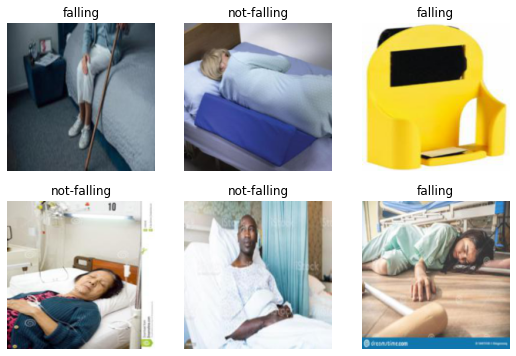

In [44]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=IndexSplitter(list(range(53))),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders('falling_or_not-before_correction/', bs=32)

dls.show_batch(max_n=6)

In [45]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,0.887699,0.679560,0.301887,01:04


epoch,train_loss,valid_loss,error_rate,time
0,0.343758,0.617453,0.207547,01:36
1,0.283285,0.601936,0.113208,01:33
2,0.224027,0.427125,0.094340,01:55


In [46]:
valid_set_falling = get_image_files('falling_or_not-before_correction/falling')[:53]
valid_set_not_falling = get_image_files('falling_or_not-before_correction/not-falling')[:53]

In [47]:
%matplotlib inline
import matplotlib.pyplot as plt

def test_all_images(valid_set):
  for img in valid_set:
    img = PILImage.create(img)
    is_falling, _, probs = learn.predict(img)
    plt.figure()
    plt.imshow(img)
    plt.xlabel(f'This patient is {is_falling}. Probability(falling): {probs[0]:.4f}')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


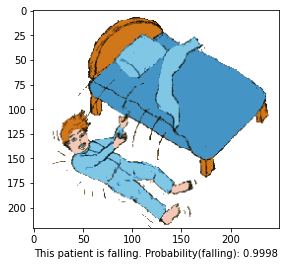

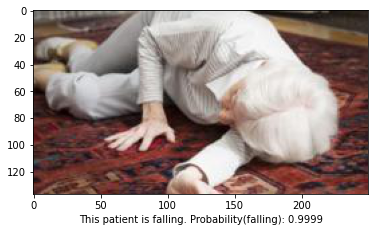

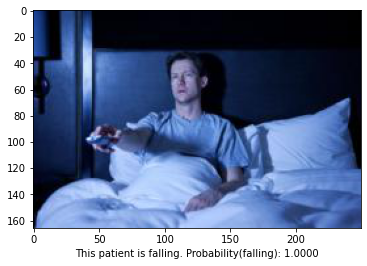

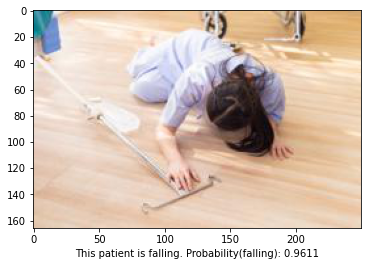

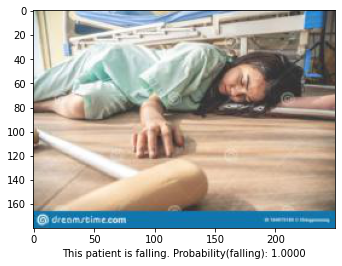

...

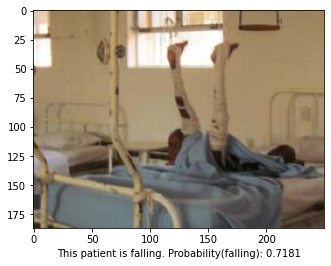

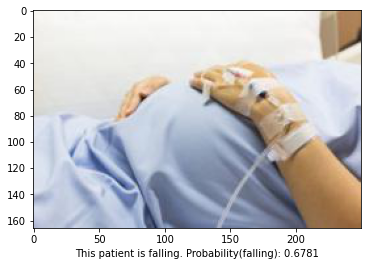

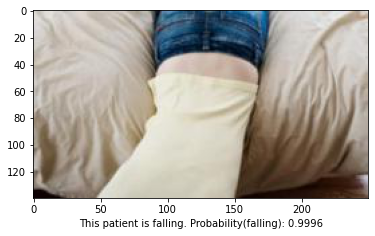

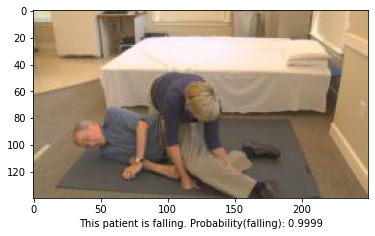

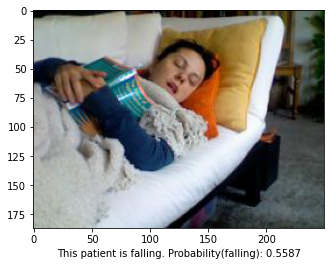

In [48]:
test_all_images(valid_set_falling)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


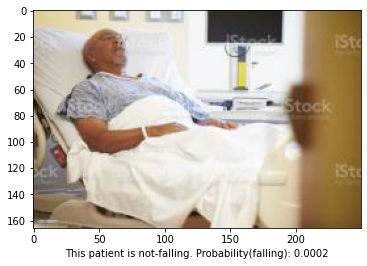

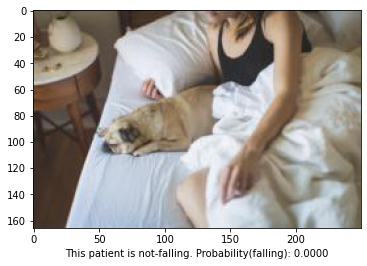

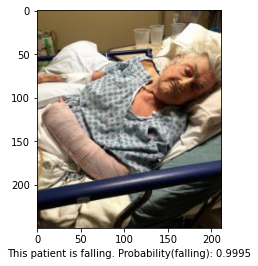

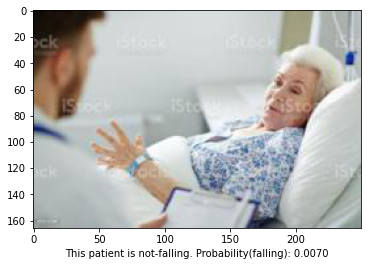

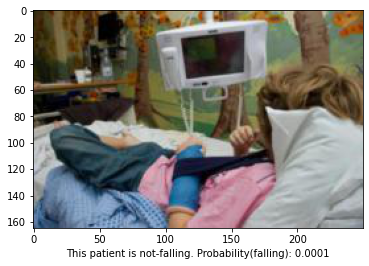

...

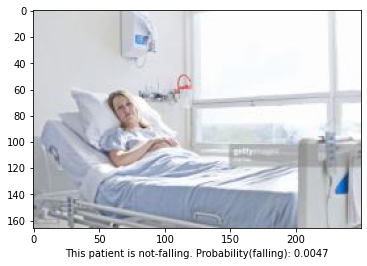

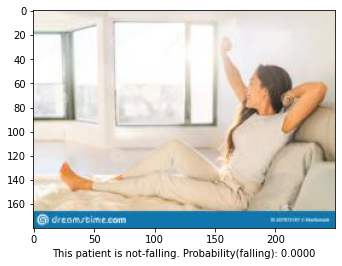

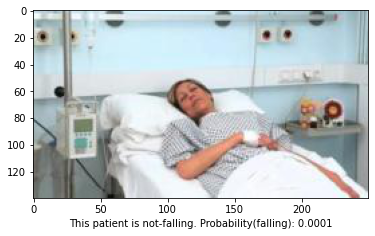

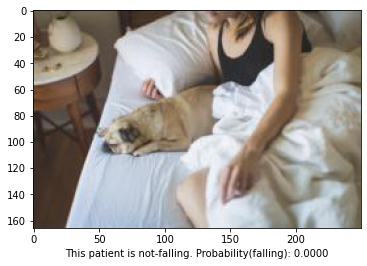

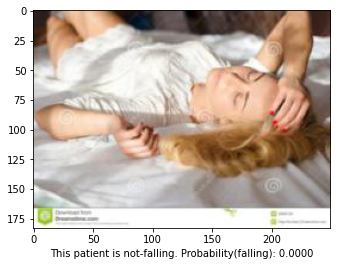

In [49]:
test_all_images(valid_set_not_falling)